<table style="text-align:center; width:100%;">
    <colgroup>
       <col span="1" style="width: 15%;">
       <col span="1" style="width: 50%;">
       <col span="1" style="width: 15%;">
    </colgroup>
    <tbody>
        <tr>
            <td><img src="../figures/milky_way_dcos.png"></td>
            <td>
                <span style="font-size:50px;">Galaxy Creation Station</span><br>
                <span style="font-size:20px;"><i>Part of the notebook series for Wagg et al. 2021</i></span><br><br>
                <p style="text-align:center; font-size:15px;">This notebook demonstrates the method in Wagg et al. (2021) for sampling positions, birth times and metallicities in the Milky Way and how to reproduce the various plots in Figure 1, the second panel of Figure 4 and Figure 14.</p>
            </td>
            <td><img src="../figures/milky_way_dcos.png"></td>
        </tr>
    </tbody>
</table>

In [43]:
# general package imports
import h5py as h5
import numpy as np
import astropy.units as u

from astropy.coordinates import SkyCoord
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
import seaborn as sns
from scipy.integrate import quad
from scipy.stats import beta
from seaborn_utility import cmap_from_colour

# custom LISA package
import legwork

# import code from repo
import sys
sys.path.append("../../simulation/src/")
import galaxy

from importlib import reload

In [2]:
# config stuff to make plots look pretty
%config InlineBackend.figure_format = 'retina'
plt.rc('font', family='serif')
fs = 24

params = {'legend.fontsize': fs,
         'axes.labelsize': fs,
         'xtick.labelsize':0.7*fs,
         'ytick.labelsize':0.7*fs}
plt.rcParams.update(params)

# Model description

## Model Components
For our model of the Milky Way, we assume that the galaxy is composed of three components: a thin disc, a thick disc and a bulge. For each of these we have a distribution for the lookback time, galactocentric radii and heights above the Galactic plane, which we will outline below. First, we can recall that these components have different masses and so will be weighted differently.

We use [Licquia+2015](https://ui.adsabs.harvard.edu/abs/2015ApJ...806...96L/abstract) to get the stellar mass of the disc and bulge. We additionally assume that the thick and thin discs have equal masses.

In [3]:
# masses
stellar_mass = {
    "bulge": 0.91e10 * u.Msun,
    "thin_disc": 5.17e10 * u.Msun / 2,
    "thick_disc": 5.17e10 * u.Msun / 2,
}

total_stellar_mass = 6.08e10 * u.Msun

stellar_mass_fractions = {}
for key in stellar_mass.keys():
    stellar_mass_fractions[key] = stellar_mass[key] / total_stellar_mass

## Star formation history
First, we can take a look at the star formation history (SFH). For the thick and thin discs this exponentially declines over the age of the Milky Way at the same rate, using Eq. 4 from [Frankel+18](https://ui.adsabs.harvard.edu/abs/2018ApJ...865...96F/abstract). The thick disc is limited from 8 Gyr to 12 Gyr, then at 8 Gyr the thick disc ends and formation switches to the thin disc. The SFH of the bulge is not well known but we approximate it using a $\beta$ function that peaks around 8 Gyr and drops off at later time. This shape was chosen to fit Fig.7 of [Bovy+19](https://ui.adsabs.harvard.edu/abs/2019MNRAS.490.4740B/abstract).

In [4]:
def disc_SFH(t, tm=12*u.Gyr, tsfr=6.8*u.Gyr, min_time=0*u.Gyr, max_time=8*u.Gyr):
    norm = quad(lambda t: np.exp(-(tm - t * u.Gyr) / tsfr),
                min_time.to(u.Gyr).value, max_time.to(u.Gyr).value)[0]
    SFH = np.exp(-(tm - t) / tsfr) / norm
    SFH[np.logical_or(t < min_time, t > max_time)] = 0.0
    return SFH

def bulge_SFH(t):
    return beta(2, 3, loc=6, scale=6).pdf(t.to(u.Gyr).value)

def total_SFH(t):
    return stellar_mass_fractions["bulge"] * bulge_SFH(t) \
        + stellar_mass_fractions["thin_disc"] * disc_SFH(t, min_time=0*u.Gyr, max_time=7.9999*u.Gyr) \
        + stellar_mass_fractions["thick_disc"] * disc_SFH(t, min_time=8*u.Gyr, max_time=12*u.Gyr)

Let's plot the total SFH of the Milky Way model and also plot the individual SFHs underneath so it is clear where the shape comes from.

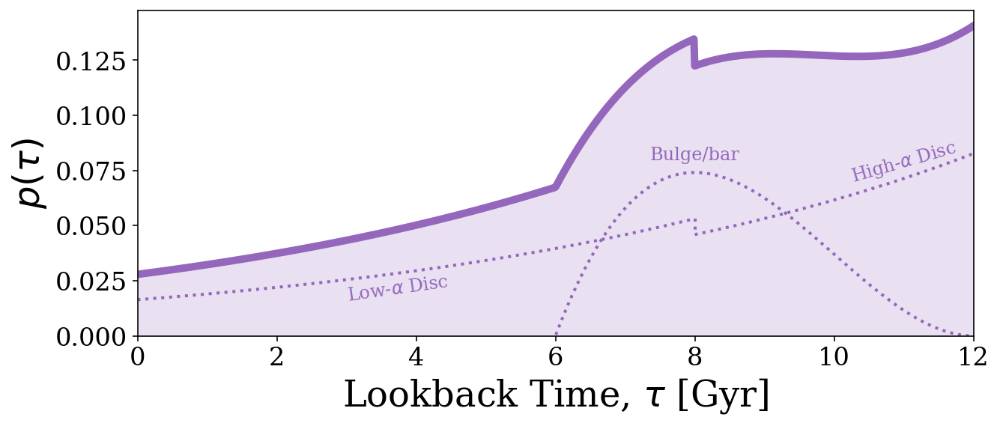

In [5]:
fig, ax = plt.subplots(1, figsize=(10, 4))
colour = "tab:purple"
t_range = np.linspace(0, 12, 1000) * u.Gyr

# calculate each individual SFH and plot them 
SFHs = [disc_SFH(t_range, min_time=0*u.Gyr, max_time=7.9999*u.Gyr),
        disc_SFH(t_range, min_time=8*u.Gyr, max_time=12*u.Gyr),
        bulge_SFH(t_range)]

for SFH in SFHs:
    nonzero = SFH > 0.0
    ax.plot(t_range[nonzero], SFH[nonzero] * 0.25, color=colour, lw=2, linestyle="dotted")

# plot a line between the discontinuous disc models
ax.plot([8, 8] * u.Gyr, np.array([disc_SFH(7.9999*u.Gyr, min_time=0*u.Gyr, max_time=8*u.Gyr),
                                  disc_SFH(8*u.Gyr, min_time=8*u.Gyr, max_time=12*u.Gyr)]) * 0.25,
        lw=2, linestyle="dotted", color=colour)

# plot the full SFH
ax.plot(t_range, total_SFH(t_range), color="tab:purple", lw=5)
ax.fill_between(t_range, 0, total_SFH(t_range), color="tab:purple", alpha=0.2)

ax.set_xlabel(r"Lookback Time, $\tau$ [Gyr]")
ax.set_ylabel(r"$p(\tau)$")

ax.set_xlim(0, 12)
ax.set_ylim(bottom=0)

# label each individual SFH
ax.annotate(r"Low-$\alpha$ Disc", xy=(3, 0.016), rotation=8, fontsize=0.5*fs, color="tab:purple")
ax.annotate("Bulge/bar", xy=(8, 0.08), ha="center", fontsize=0.5*fs, color="tab:purple")
ax.annotate(r"High-$\alpha$ Disc", xy=(11, 0.07), ha="center", rotation=16, fontsize=0.5*fs, color="tab:purple")

# plt.savefig("../figures/lookback_time_pdf.pdf", format="pdf", bbox_inches="tight")

plt.show()

## Radial distribution
For the radial distribution we use the same distribution for each component but with a different scale length. The bulge and thick disc have fixed scale lengths of 1.5 kpc ([Bovy+19](https://ui.adsabs.harvard.edu/abs/2019MNRAS.490.4740B/abstract)) and 2.33 kpc ([Bovy+16](https://ui.adsabs.harvard.edu/abs/2016ApJ...823...30B/abstract)) respectively. The scale length of the thin disc is time dependent and the disc gradually becomes more spread out due to inside-out growth following [Frankel+18](https://ui.adsabs.harvard.edu/abs/2018ApJ...865...96F/abstract).

In [6]:
def R_exp(t, alpha=0.3):
    return 4 * u.kpc * (1 - alpha * (t / (8 * u.Gyr)))

def radial_distribution(r, r0):
    return np.exp(-r / r0) * r / r0**2

def total_radial(r, t):
    return stellar_mass_fractions["bulge"] * radial_distribution(r, r0=1.5 * u.kpc) \
        + stellar_mass_fractions["thin_disc"] * radial_distribution(r, R_exp(t)) \
        + stellar_mass_fractions["thick_disc"] * radial_distribution(r, r0=1/0.43 * u.kpc)

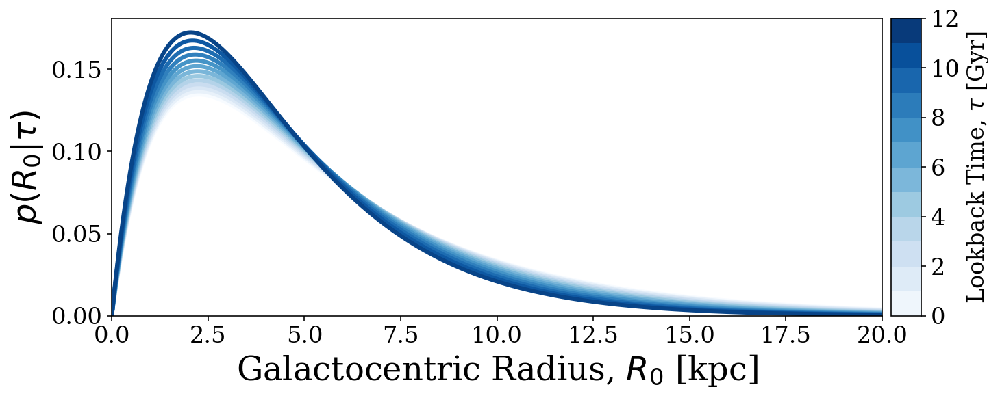

In [46]:
fig, ax = plt.subplots(1, figsize=(12, 4))

cmap = "Blues"

R_range = np.linspace(0, 20, 1000) * u.kpc
t_range = np.linspace(0, 12, 13)

# plot a separate distribution for lots of lookback times
for t in t_range:
    ax.plot(R_range, total_radial(R_range, t * u.Gyr), lw=3, color=plt.get_cmap(cmap)((t / len(t_range))))

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=max(t_range)))
cbar = fig.colorbar(sm, boundaries=t_range, aspect=10, pad=0.01)
cbar.set_label(r"Lookback Time, $\tau$ [Gyr]", fontsize=0.7 * fs)
    
ax.set_xlabel(r"Galactocentric Radius, $R_0$ [kpc]")
ax.set_xlim(0, 20)
ax.set_ylabel(r"$p(R_0 | \tau)$")
ax.set_ylim(bottom=0.0)

# plt.savefig("../figures/radial_pdf.pdf", format="pdf", bbox_inches="tight")

plt.show()

## Metallicity relation
Using [Frankel+18](https://ui.adsabs.harvard.edu/abs/2018ApJ...865...96F/abstract), we assume a tight metallicity-location-time relation and thus, for any given radius and time, we know the metallicity using the function below. We convert this from [Fe/H] to $Z$ using the function from Bertelli 1994.

In [8]:
def FeH(R, t, tm=12*u.Gyr, Fm=-1, grad=-0.075/u.kpc, Rnow=8.7*u.kpc, gamma=0.3):
    return Fm + grad * R - (Fm + grad * Rnow) * (1 - (t / tm))**(gamma)

def metallicity(R, t, zsun=0.0142):
    # See Bertelli 1994 Equation 9
    return np.power(10, 0.977 * FeH(R, t) + np.log10(zsun))

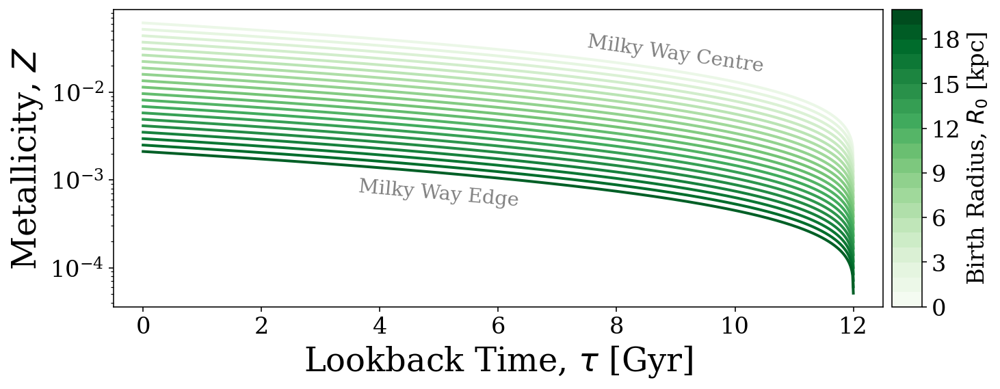

In [9]:
fig, ax = plt.subplots(1, figsize=(12, 4))

cmap = "Greens"

R_range = np.linspace(0, 20, 21)
t_range = np.linspace(0, 12, 1000) * u.Gyr
colors = plt.get_cmap(cmap, len(R_range) + 4)

for i in range(len(R_range)):
    ax.plot(t_range, metallicity(R_range[i] * u.kpc, t_range), lw=2, color=colors(i + 2))

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=max(R_range)))
cbar = fig.colorbar(sm, boundaries=R_range, aspect=10, pad=0.01)
cbar.set_label(r"Birth Radius, $R_0$ [kpc]", fontsize=0.7 * fs)

ax.set_xlabel(r"Lookback Time, $\tau$ [Gyr]")
ax.set_xlim(-0.5, 12.5)
ax.set_ylabel(r"Metallicity, $Z$")
ax.set_yscale("log")

ax.annotate("Milky Way Centre", xy=(9, 2.7e-2), rotation=-8, ha="center", va="center", color="grey", fontsize=0.6*fs)
ax.annotate("Milky Way Edge", xy=(5, 7e-4), rotation=-5, ha="center", va="center", color="grey", fontsize=0.6*fs)

# plt.savefig("../figures/metallicity_relation.pdf", format="pdf", bbox_inches="tight")

plt.show()

## Vertical spread
As with the radial distribution, we use the same height distribution for each component but with a different scale height. For the bulge we use a scale height of 1.5 kpc, the thick disc we use 0.95 kpc ([Bovy+16](https://ui.adsabs.harvard.edu/abs/2016ApJ...823...30B/abstract)) and the thin disc we use 0.3 kpc ([McMillan11](https://ui.adsabs.harvard.edu/abs/2011MNRAS.414.2446M/abstract))

In [10]:
def P_z(z, zd=0.3 * u.kpc):
    return 1 / zd * np.exp(-z/zd)

def total_vertical(z):
    return stellar_mass_fractions["bulge"] * P_z(z, zd=0.2 * u.kpc) \
        + stellar_mass_fractions["thin_disc"] * P_z(z, zd=0.3 * u.kpc) \
        + stellar_mass_fractions["thick_disc"] * P_z(z, zd=0.95 * u.kpc)

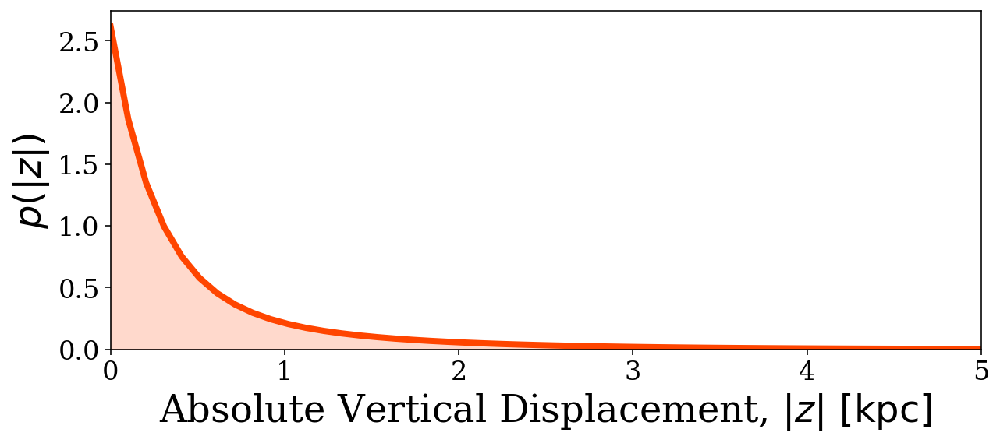

In [48]:
z_range = np.linspace(0, 5) * u.kpc

fig, ax = plt.subplots(1, figsize=(10, 4))

color = "orangered"

ax.plot(z_range, total_vertical(z_range), lw=4, color=color)
ax.fill_between(z_range, 0, total_vertical(z_range), color=color, alpha=0.2)

ax.set_xlabel(r"Absolute Vertical Displacement, $|z|\ [\rm kpc]$")
ax.set_ylabel(r"$p(|z|)$")

# ax.set_yscale("log")

ax.set_xlim(0, max(z_range.value))
ax.set_ylim(bottom=0)

# plt.savefig("../figures/vertical_pdf.pdf", format="pdf", bbox_inches="tight")

plt.show()

# Overall model
Now we can take what we've done throughout this notebook and put it all together to draw from the entire Milky Way model.

## Random example galaxy
Let's first plot a random example galaxy

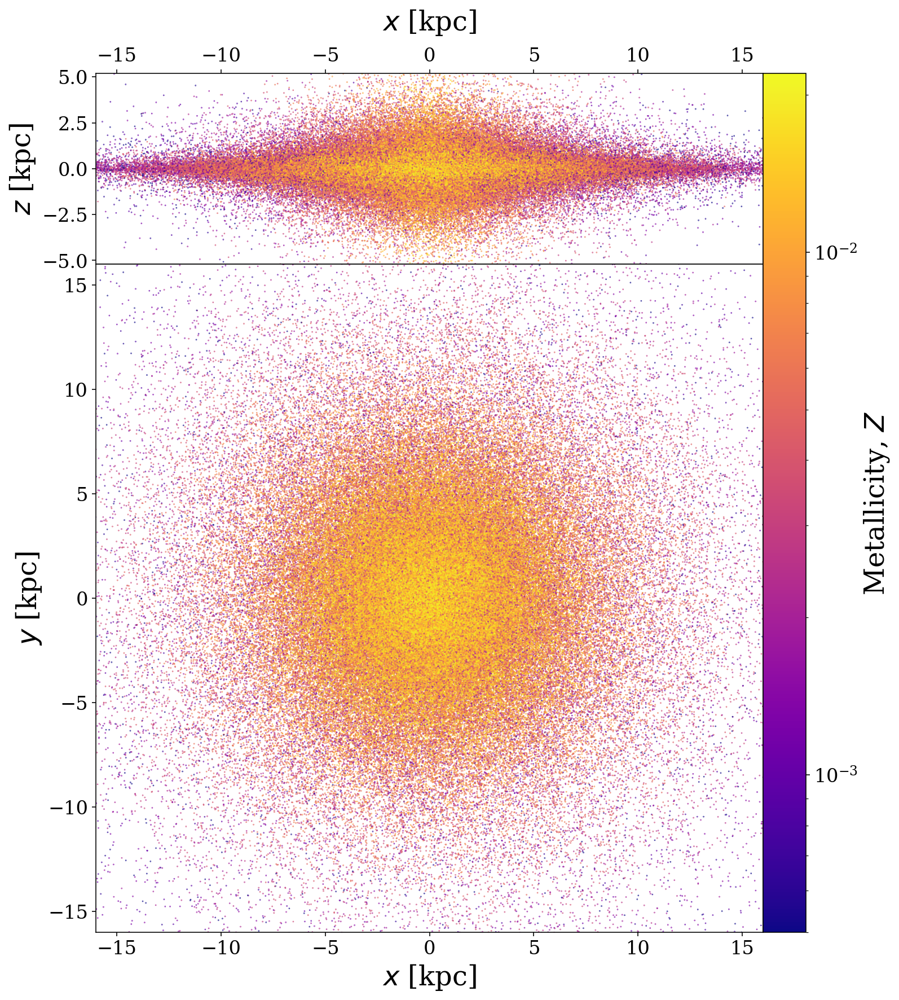

In [40]:
# use the main function to draw from the Milky Way
tau, D, Z, pos, components = galaxy.simulate_mw(250000, ret_pos=True)
R, z, theta = pos

# randomise the order of the simulated systems so that everything is well mixed
random_order = np.random.permutation(len(tau))
tau = tau[random_order]
D = D[random_order]
Z = Z[random_order]
R = R[random_order]
z = z[random_order]
theta = theta[random_order]

# reset any metallicities outside of the allowed range
min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

# work out the x and y positions with trig
x = R * np.cos(theta)
y = R * np.sin(theta)

fig, axes = plt.subplots(2, 1, figsize=(10 * 1.2475, 14), gridspec_kw={'height_ratios': [4, 14]})
axes[1].set_aspect("equal")
plt.subplots_adjust(hspace=0)

# set the maximum distance from the centre of the Milky Way
lim = 16

axes[0].scatter(x, z, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))

axes[0].set_xlabel(r"$x$ [kpc]", labelpad=15)
axes[0].xaxis.tick_top()
axes[0].xaxis.set_label_position("top")
axes[0].set_xlim(-lim, lim)

axes[0].set_ylabel(r"$z$ [kpc]")
axes[0].set_ylim(-5.2, 5.2)

scatt = axes[1].scatter(x.value, y.value, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))
cbar = fig.colorbar(scatt, ax=axes, pad=0.0)
cbar.set_label(r"Metallicity, $Z$")

axes[1].set_xlabel(r"$x$ [kpc]")
axes[1].set_ylabel(r"$y$ [kpc]")

axes[1].set_xlim(-lim, lim)
axes[1].set_ylim(-lim, lim)

plt.savefig("../figures/random_galaxy.png", bbox_inches="tight")

plt.show()

## Individual Galactic components
We can also produce the same plots but for each individual component.

### Random low-$\alpha$ disc

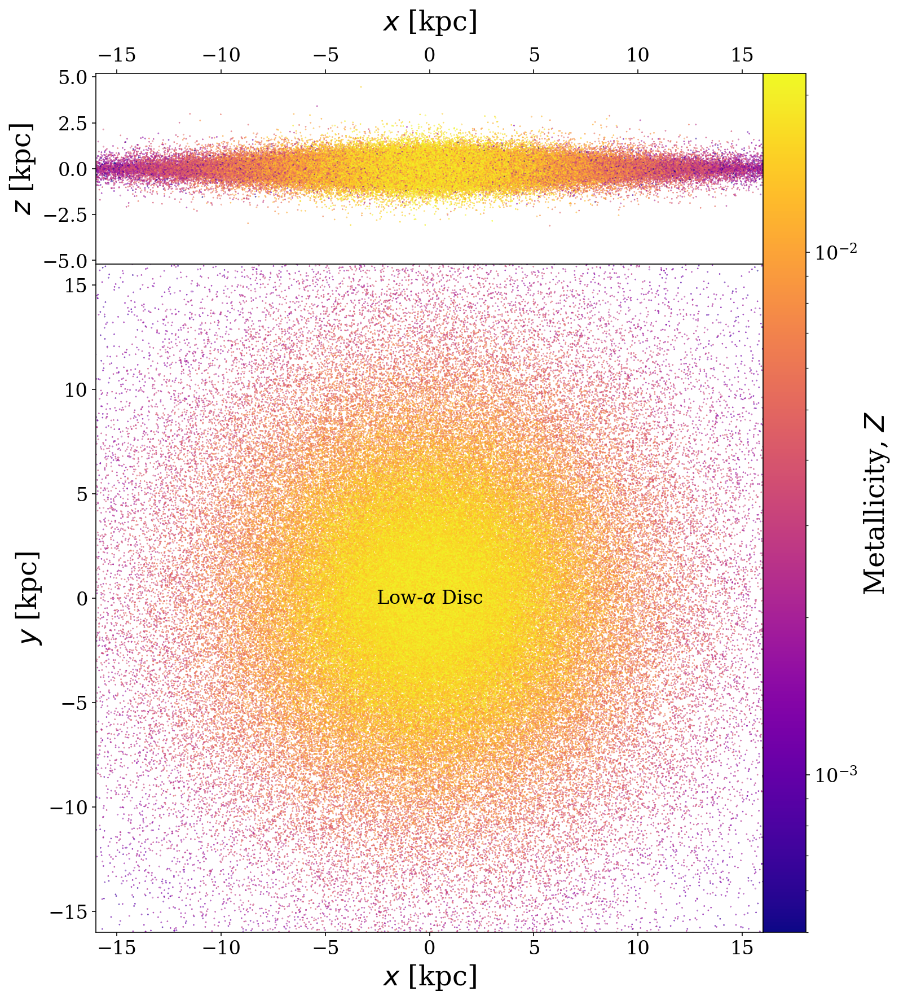

In [15]:
tau, D, Z, pos, components = galaxy.simulate_mw(250000, components=["low_alpha_disc"], masses=[1]*u.Msun, ret_pos=True)
R, z, theta = pos

random_order = np.random.permutation(len(tau))
tau = tau[random_order]
D = D[random_order]
Z = Z[random_order]
R = R[random_order]
z = z[random_order]
theta = theta[random_order]

min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

x = R * np.cos(theta)
y = R * np.sin(theta)

fig, axes = plt.subplots(2, 1, figsize=(10 * 1.2475, 14), gridspec_kw={'height_ratios': [4, 14]})
axes[1].set_aspect("equal")
plt.subplots_adjust(hspace=0)

lim = 16

axes[0].scatter(x, z, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))

axes[0].set_xlabel(r"$x$ [kpc]", labelpad=15)
axes[0].xaxis.tick_top()
axes[0].xaxis.set_label_position("top")
axes[0].set_xlim(-lim, lim)

axes[0].set_ylabel(r"$z$ [kpc]")
axes[0].set_ylim(-5.2, 5.2)

scatt = axes[1].scatter(x.value, y.value, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))
cbar = fig.colorbar(scatt, ax=axes, pad=0.0)
cbar.set_label(r"Metallicity, $Z$")

axes[1].set_xlabel(r"$x$ [kpc]")
axes[1].set_ylabel(r"$y$ [kpc]")

axes[1].set_xlim(-lim, lim)
axes[1].set_ylim(-lim, lim)

axes[1].annotate(r"Low-$\alpha$ Disc", xy=(0, 0), ha="center", va="center", fontsize=0.7*fs)

# plt.savefig("../figures/random_low_alpha_disc.png", bbox_inches="tight")

plt.show()

### Random high-$\alpha$ disc

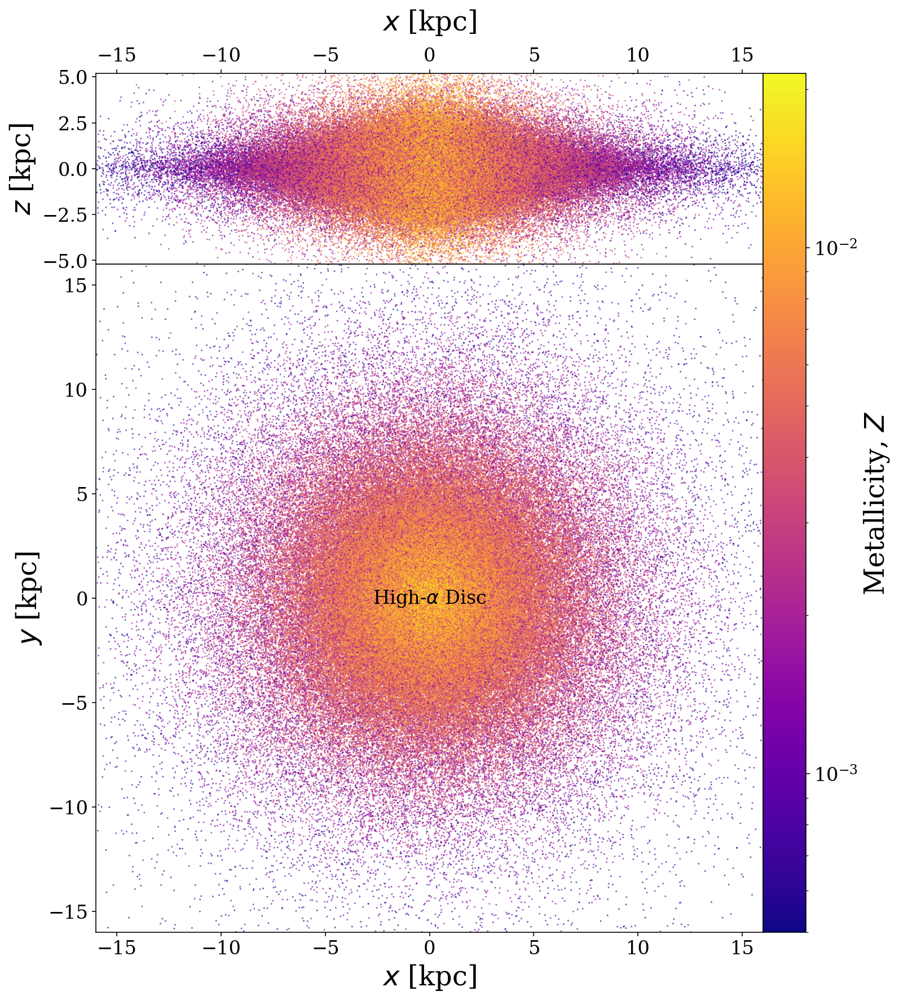

In [17]:
tau, D, Z, pos, components = galaxy.simulate_mw(250000, components=["high_alpha_disc"], masses=[1]*u.Msun, ret_pos=True)
R, z, theta = pos

random_order = np.random.permutation(len(tau))
tau = tau[random_order]
D = D[random_order]
Z = Z[random_order]
R = R[random_order]
z = z[random_order]
theta = theta[random_order]

min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

x = R * np.cos(theta)
y = R * np.sin(theta)

fig, axes = plt.subplots(2, 1, figsize=(10 * 1.2475, 14), gridspec_kw={'height_ratios': [4, 14]})
axes[1].set_aspect("equal")
plt.subplots_adjust(hspace=0)

lim = 16

axes[0].scatter(x, z, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))

axes[0].set_xlabel(r"$x$ [kpc]", labelpad=15)
axes[0].xaxis.tick_top()
axes[0].xaxis.set_label_position("top")
axes[0].set_xlim(-lim, lim)

axes[0].set_ylabel(r"$z$ [kpc]")
axes[0].set_ylim(-5.2, 5.2)

scatt = axes[1].scatter(x.value, y.value, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))
cbar = fig.colorbar(scatt, ax=axes, pad=0.0)
cbar.set_label(r"Metallicity, $Z$")

axes[1].set_xlabel(r"$x$ [kpc]")
axes[1].set_ylabel(r"$y$ [kpc]")

axes[1].set_xlim(-lim, lim)
axes[1].set_ylim(-lim, lim)

axes[1].annotate(r"High-$\alpha$ Disc", xy=(0, 0), ha="center", va="center", fontsize=0.7*fs)

# plt.savefig("../figures/random_high_alpha_disc.png", bbox_inches="tight")

plt.show()

### Random bulge

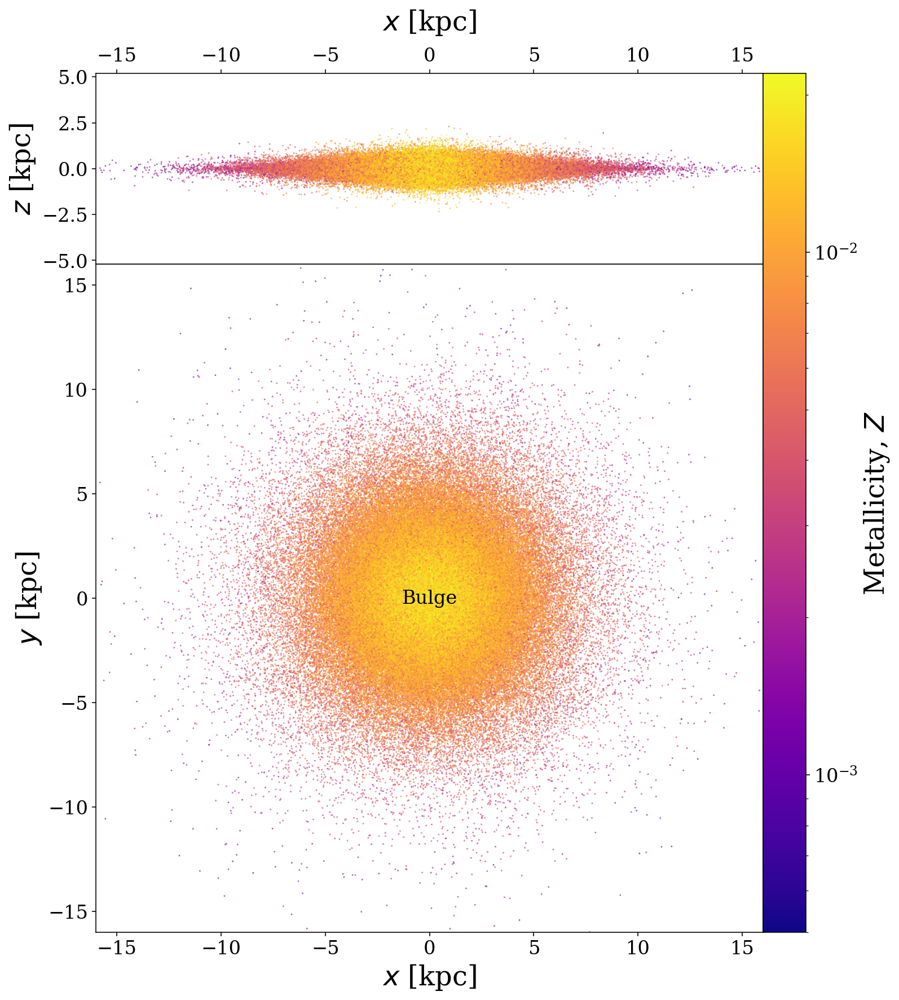

In [41]:
tau, D, Z, pos, components = galaxy.simulate_mw(250000, components=["bulge"], masses=[1]*u.Msun, ret_pos=True)
R, z, theta = pos

random_order = np.random.permutation(len(tau))
tau = tau[random_order]
D = D[random_order]
Z = Z[random_order]
R = R[random_order]
z = z[random_order]
theta = theta[random_order]

min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

x = R * np.cos(theta)
y = R * np.sin(theta)

fig, axes = plt.subplots(2, 1, figsize=(10 * 1.2475, 14), gridspec_kw={'height_ratios': [4, 14]})
axes[1].set_aspect("equal")
plt.subplots_adjust(hspace=0)

lim = 16

axes[0].scatter(x, z, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))

axes[0].set_xlabel(r"$x$ [kpc]", labelpad=15)
axes[0].xaxis.tick_top()
axes[0].xaxis.set_label_position("top")
axes[0].set_xlim(-lim, lim)

axes[0].set_ylabel(r"$z$ [kpc]")
axes[0].set_ylim(-5.2, 5.2)

scatt = axes[1].scatter(x.value, y.value, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))
cbar = fig.colorbar(scatt, ax=axes, pad=0.0)
cbar.set_label(r"Metallicity, $Z$")

axes[1].set_xlabel(r"$x$ [kpc]")
axes[1].set_ylabel(r"$y$ [kpc]")

axes[1].set_xlim(-lim, lim)
axes[1].set_ylim(-lim, lim)

axes[1].annotate("Bulge", xy=(0, 0), ha="center", va="center", fontsize=0.7*fs)

# plt.savefig("../figures/random_bulge.png", bbox_inches="tight")

plt.show()

## Random simple Milky Way
We can also explore a simpler model for the Milky Way by following Breivik+20 and applying their model instead.

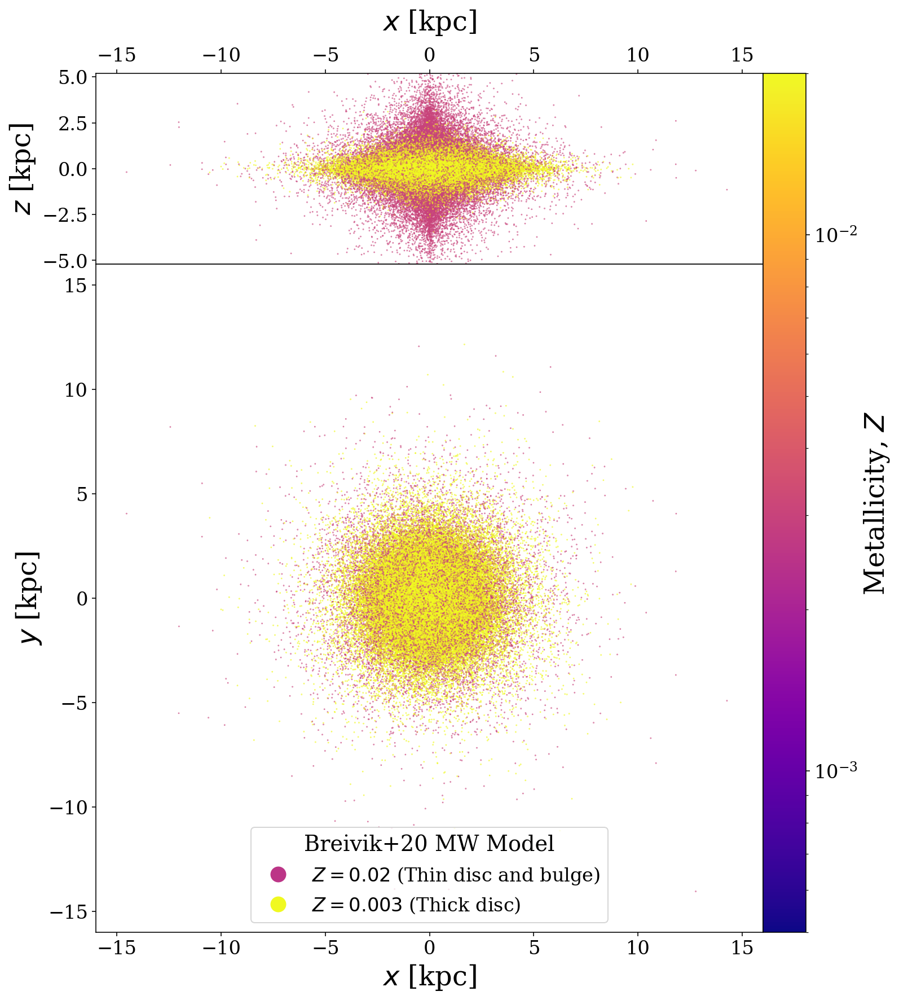

In [22]:
tau, D, Z, pos, components = galaxy.simulate_simple_mw(250000, ret_pos=True)
R, z, theta = pos

# shuffle everything
random_order = np.random.permutation(len(tau))
tau = tau[random_order]
D = D[random_order]
Z = Z[random_order]
R = R[random_order]
z = z[random_order]
theta = theta[random_order]

min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

x = R * np.cos(theta)
y = R * np.sin(theta)
fig, axes = plt.subplots(2, 1, figsize=(10 * 1.2475, 14), gridspec_kw={'height_ratios': [4, 14]})
axes[1].set_aspect("equal")
plt.subplots_adjust(hspace=0)

lim = 16

axes[0].scatter(x, z, c=Z, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))

axes[0].set_xlabel(r"$x$ [kpc]", labelpad=15)
axes[0].xaxis.tick_top()
axes[0].xaxis.set_label_position("top")
axes[0].set_xlim(-lim, lim)

axes[0].set_ylabel(r"$z$ [kpc]")
axes[0].set_ylim(-5.2, 5.2)

scatt = axes[1].scatter(x.value, y.value, c=Z, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))
cbar = fig.colorbar(scatt, ax=axes, pad=0.0)
cbar.set_label(r"Metallicity, $Z$")

Z_low_col = plt.get_cmap("plasma")((np.log10(3e-3) - np.log10(5e-4)) / (np.log10(3e-2) - np.log10(5e-4)))
legend_elements = [Line2D([0], [0], marker='o', color='w', label=r'$Z=0.02$ (Thin disc and bulge)',
                          markerfacecolor=Z_low_col, markersize=15),
                  Line2D([0], [0], marker='o', color='w', label=r'$Z=0.003$ (Thick disc)',
                          markerfacecolor=plt.get_cmap("plasma")(1.0), markersize=15)]

legend = axes[1].legend(handles=legend_elements, loc='lower center', fontsize=0.7*fs, title="Breivik+20 MW Model")
legend.get_title().set_fontsize(0.8*fs)

axes[1].set_xlabel(r"$x$ [kpc]")
axes[1].set_ylabel(r"$y$ [kpc]")

axes[1].set_xlim(-lim, lim)
axes[1].set_ylim(-lim, lim)

# plt.savefig("../figures/random_simple_galaxy.png", bbox_inches="tight")

plt.show()

# Plot detectable systems in their Galactic positions

Let's also switch gears and look at where the detectable LISA systems will lie in the galaxy. For this we take in the data from the simulation files and create a 2D KDE density plot on the Galactic plane with a face-on view.

In [138]:
# define what DCOs we are working with and a colour scheme
dco_types = ["BHBH", "BHNS", "NSNS"]
dco_colours = {"BHBH": plt.get_cmap("plasma")(0.2), 
               "BHNS": plt.get_cmap("plasma")(0.5),
               "NSNS": plt.get_cmap("plasma")(0.8)}

# IMPORTANT: these need to point to the folders where you stored the data from Zenodo
data_folder = "../../simulation/data/"
sim_folder = data_folder + "simulation/"

detections_4yr = np.load(data_folder + "detections_4yr.npy")

In [51]:
levels = [0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
level_labels = ["95%", "90%", "75%", "50%", "25%", "10%", "0%"]

x = {"BHBH": None, "BHNS": None, "NSNS": None, "ALL": None}
y = {"BHBH": None, "BHNS": None, "NSNS": None, "ALL": None}
z = {"BHBH": None, "BHNS": None, "NSNS": None, "ALL": None}
w = {"BHBH": None, "BHNS": None, "NSNS": None, "ALL": None}

for dco_type in dco_types:
    with h5.File(sim_folder + "{}_{}_all.h5".format(dco_type, "fiducial"), "r") as f:
        data = f["simulation"][...].squeeze()

        R, theta, z[dco_type] = data["R"], data["theta"], data["z"]
        x[dco_type], y[dco_type] = R * np.cos(theta), R * np.sin(theta)
        w[dco_type] = data["weight"] / data["weight"].sum() * 1e4
        
        if x["ALL"] is None:
            x["ALL"] = x[dco_type]
            y["ALL"] = y[dco_type]
            z["ALL"] = z[dco_type]
            w["ALL"] = w[dco_type]
        else:
            x["ALL"] = np.concatenate((x["ALL"], x[dco_type]))
            y["ALL"] = np.concatenate((y["ALL"], y[dco_type]))
            z["ALL"] = np.concatenate((z["ALL"], z[dco_type]))
            w["ALL"] = np.concatenate((w["ALL"], w[dco_type]))

BHBH
BHBH done
BHNS
BHNS done
NSNS
NSNS done


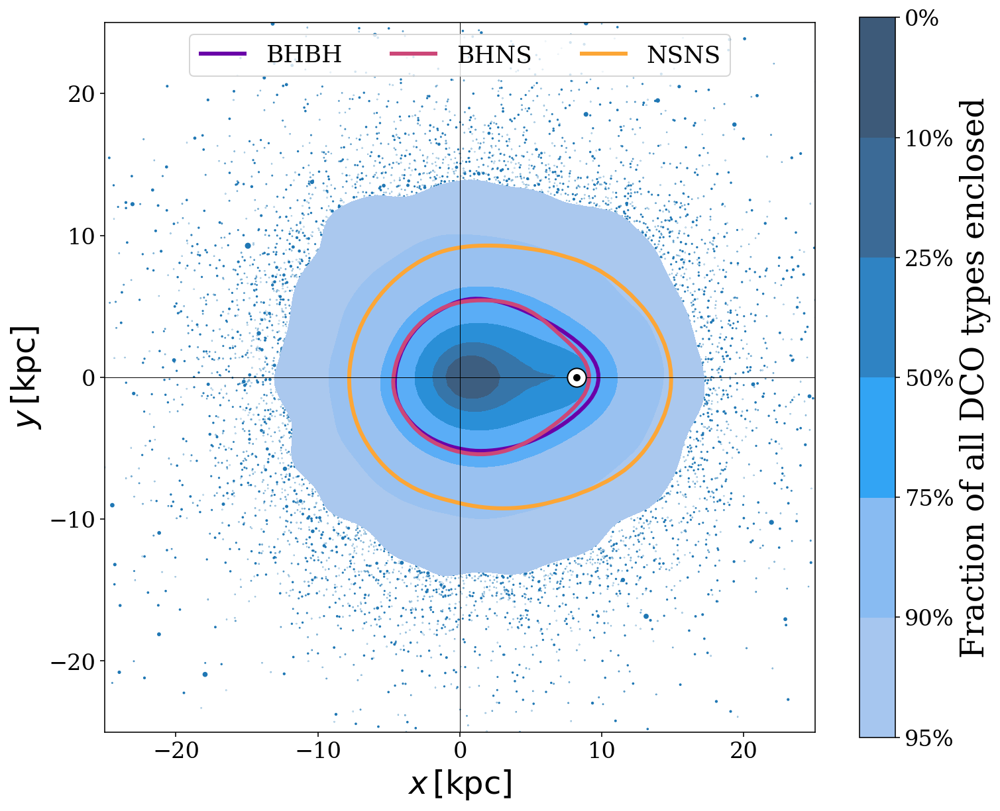

In [53]:
fig, ax = plt.subplots(figsize=(12, 10))
ax.set_aspect("equal")

ax.scatter(x=x["ALL"], y=y["ALL"], s=w["ALL"])

cmap = cmap_from_colour("tab:blue")
scatter = ax.scatter(np.ones_like(levels) * 1e5, np.ones_like(levels) * 1e5, c=levels, cmap=cmap)
cbar = fig.colorbar(scatter, ax=ax, boundaries=levels)
cbar.set_ticklabels(level_labels)
cbar.ax.tick_params(labelsize=0.7*fs)
cbar.set_label("Fraction of all DCO types enclosed")

sns.kdeplot(x=x["ALL"], y=y["ALL"], weights=w["ALL"], fill=True, levels=levels, zorder=5, bw_adjust=1.5)
    
for dco_type in dco_types:
    print(dco_type)
    sns.kdeplot(x=x[dco_type], y=y[dco_type], weights=w[dco_type], fill=False, levels=[0.25], linewidths=3, color=dco_colours[dco_type], zorder=6, label=dco_type, bw_adjust=1.5)
    print(dco_type, "done")
    
Rsun = 8.2 * u.kpc
thetasun = 0 * u.deg
xsun, ysun = Rsun * np.cos(thetasun), Rsun * np.sin(thetasun)
ax.scatter(xsun, ysun, s=200, marker="o", edgecolor="black", facecolor="white", zorder=7)
ax.scatter(xsun, ysun, s=20, marker="o", color="black", zorder=8)

# ax.scatter(0, 0, s=100, marker="x", color="black", zorder=7)
    
lim = 25
ax.set_xlim(-lim, lim)
ax.set_ylim(-lim, lim)

ax.plot([0, 0], [-lim, lim], color="black", lw=0.5, zorder=6)
ax.plot([-lim, lim], [0, 0], color="black", lw=0.5, zorder=6)

ax.set_xlabel(r"$x \, [\rm kpc]$")
ax.set_ylabel(r"$y \, [\rm kpc]$")

leg = ax.legend(fontsize=0.75*fs, loc="upper center", ncol=3)
leg.set_zorder(10)

plt.savefig("../figures/galaxy_density_distribution.png", dpi=300, bbox_inches="tight")

plt.show()

## Transform positions into sky coordinates
Here we do the same as above but plot the points in their sky positions using right ascension and declination.

In [40]:
coords = SkyCoord(x=x["ALL"], y=y["ALL"], z=z["ALL"], unit="kpc", frame="galactocentric", representation_type="cartesian")
icrs_coords = coords.transform_to("icrs")

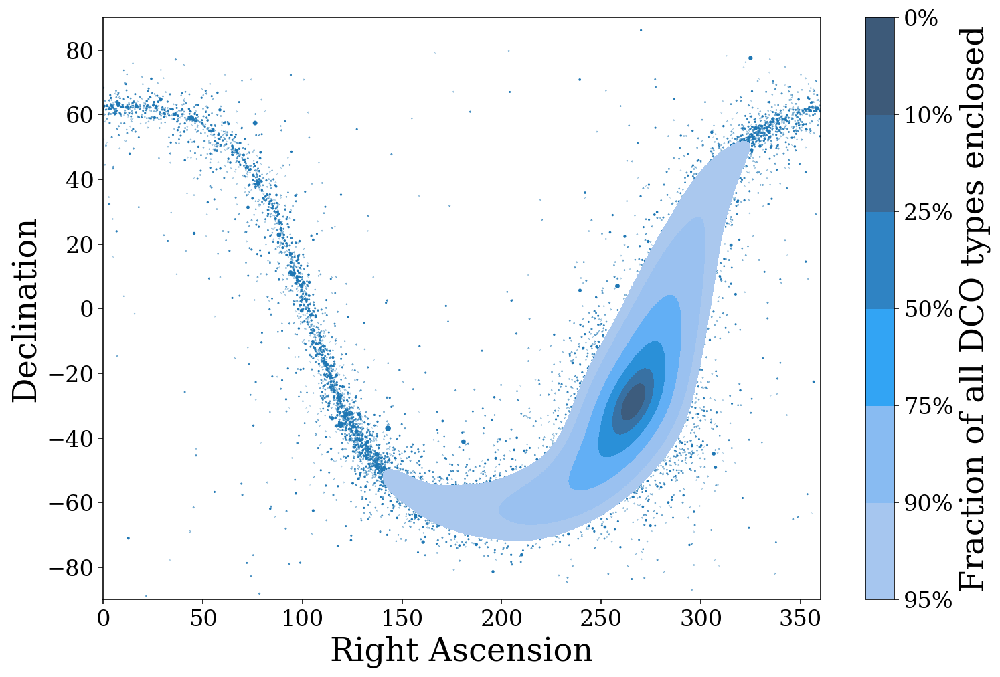

In [42]:
fig, ax = plt.subplots()

cmap = cmap_from_colour("tab:blue")
scatter = ax.scatter(np.ones_like(levels) * 1e5, np.ones_like(levels) * 1e5, c=levels, cmap=cmap)
cbar = fig.colorbar(scatter, ax=ax, boundaries=levels)
cbar.set_ticklabels(level_labels)
cbar.ax.tick_params(labelsize=0.7*fs)
cbar.set_label("Fraction of all DCO types enclosed")

ax.scatter(icrs_coords.ra, icrs_coords.dec, s=w["ALL"])
sns.kdeplot(x=icrs_coords.ra, y=icrs_coords.dec, weights=w["ALL"], fill=True, levels=levels, zorder=5, bw_adjust=1.5)

ax.set_xlim(0, 360)
ax.set_ylim(-90, 90)

ax.set_xlabel("Right Ascension")
ax.set_ylabel("Declination")

plt.show()

# Distribution of detectable sources among Galactic components
Here we make some pie charts to show how the detectable sources are distributed in terms of which component they are formed in.

In [33]:
def plot_component_fractions(model="fiducial", xlabel="Individually detectable harmonics"):
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    
    spacing = 0.15
    fig.subplots_adjust(wspace=-spacing, hspace=-spacing)
    
    axes = axes.flatten()
    
    color_fracs = [0.2, 0.5, 0.8]
    labels = [r"Low-$\alpha$" + "\ndisc", r"High-$\alpha$" + "\ndisc", "Bulge"]
    
    formation_sizes = [stellar_mass_fractions["thin_disc"], stellar_mass_fractions["thick_disc"], stellar_mass_fractions["bulge"]]
    axes[0].pie(formation_sizes, radius=1, wedgeprops=dict(width=0.5, edgecolor='w'),
                colors=cmap_from_colour("tab:blue")(color_fracs), labels=labels,
                rotatelabels=True, labeldistance=0.75, textprops={"color":"white", "ha":"center", "va":"center"})
    axes[0].annotate("ALL", xy=(0.5, 0.5), xycoords="axes fraction", ha="center", va="center", fontsize=fs)
    axes[0].annotate("formation", xy=(0.5, 0.42), xycoords="axes fraction", ha="center", va="center", fontsize=0.7*fs)

    for i, dco_type in enumerate(dco_types):
        with h5.File(sim_folder + "{}_{}_all.h5".format(dco_type, model), "r") as f:
            data = f["simulation"][...].squeeze()

        sizes = [np.sum(data["weight"][data["component"] == i]) for i in range(3)] / np.sum(data["weight"])

        axes[i + 1].pie(sizes, radius=1, wedgeprops=dict(width=0.5, edgecolor='w'),
                        colors=cmap_from_colour(dco_colours[dco_type])(color_fracs), labels=labels,
                        rotatelabels=True, labeldistance=0.75, textprops={"color":"white", "ha":"center", "va":"center"})
        axes[i + 1].annotate(dco_type, xy=(0.5, 0.5), xycoords="axes fraction", ha="center", va="center", fontsize=fs)
        axes[i + 1].annotate("detectable", xy=(0.5, 0.42), xycoords="axes fraction", ha="center", va="center", fontsize=0.7*fs)
        
        plt.axis("on")

    axes[-2].annotate("Fraction of systems in each Galactic component", xy=(1 - spacing / 2, 0), xycoords="axes fraction", ha="center", va="center", fontsize=fs)

    plt.show()

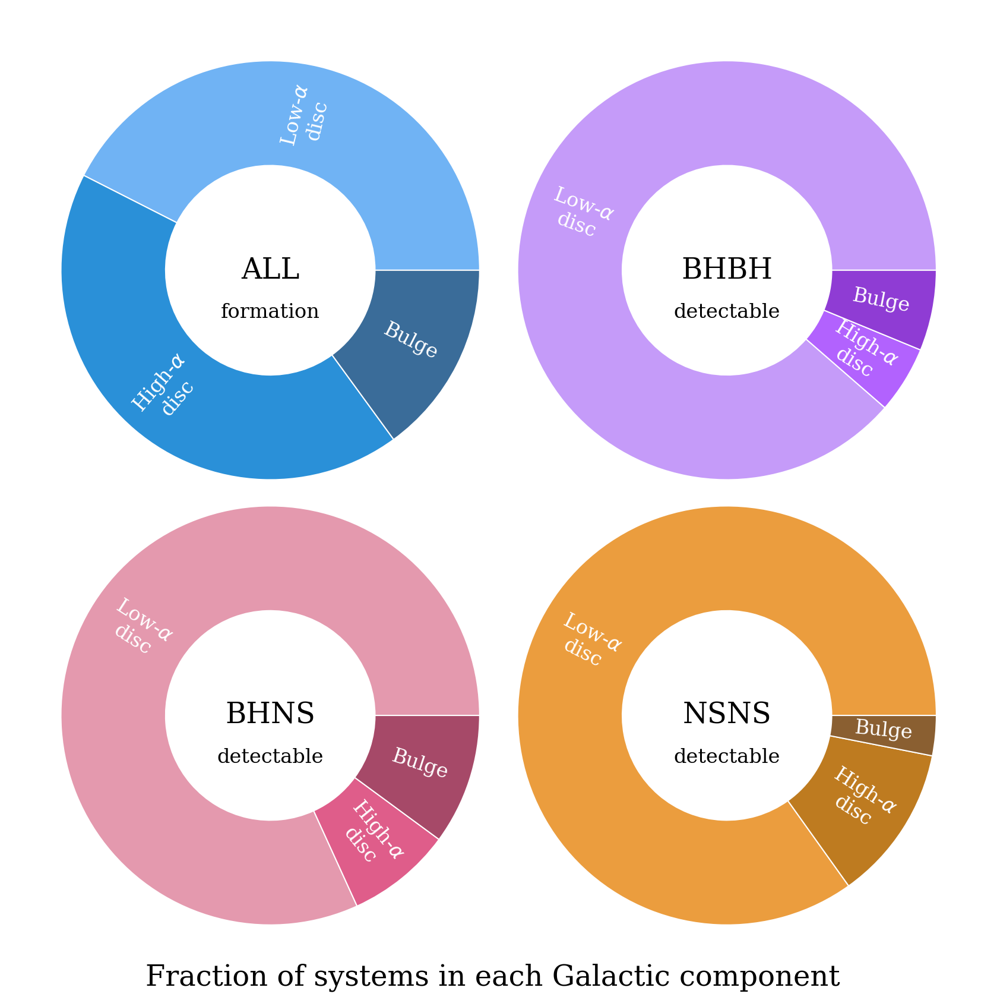

In [34]:
plot_component_fractions()

## Format all of the data into a LaTeX table

In [273]:
formation_sizes = [stellar_mass_fractions["thin_disc"], stellar_mass_fractions["thick_disc"], stellar_mass_fractions["bulge"]]
labels = [r"Low-$\alpha$ disc", r"High-$\alpha$ disc", "Bulge/bar"]
sizes = np.zeros((len(dco_types), len(labels), 1000))

In [274]:
for i, dco_type in enumerate(dco_types):
    with h5.File(sim_folder + "{}_{}_all.h5".format(dco_type, "fiducial"), "r") as f:
        data = f["simulation"][...].squeeze()
        
    for loop in range(sizes.shape[-1]):
        boot_index = np.random.choice(np.linspace(0, len(data) - 1, len(data)), size=len(data), replace=True).astype(int)
        
        for j in range(len(labels)):
            sizes[i][j][loop] = np.sum(data["weight"][boot_index][data["component"][boot_index] == j]) / np.sum(data["weight"][boot_index])

In [275]:
all_sizes = (sizes.mean(axis=2).round(2) * (detections_4yr[:, 0].mean(axis=1) / detections_4yr[:, 0].mean(axis=1).sum())[:, np.newaxis]).sum(axis=0).round(2) * 100
for i in range(len(labels)):
    line = labels[i] + " & " + str((formation_sizes[i] * 100).round(1)) + "\%"
    line += " & {:d}\%".format(int(all_sizes[i]))
    for j in range(len(dco_types)):
        
        line += " & " + str(int((sizes[j][i].mean() * 100).round(0))) + "\%"    
    
    line += "\\\\"
    print(line)

Low-$\alpha$ disc & 42.5\% & 86\% & 89\% & 82\% & 85\%\\
High-$\alpha$ disc & 42.5\% & 6\% & 5\% & 8\% & 12\%\\
Bulge/bar & 15.0\% & 7\% & 6\% & 10\% & 3\%\\
